# Load Modules

In [1]:
import os
import time
import sys
sys.path.append("../Library/")
import random
import numpy as np
import pandas as pd

from PIL import Image
import seaborn as sns
#sns.set(style="whitegrid")
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow

%matplotlib inline
%load_ext autoreload
%autoreload 2

from dotenv import load_dotenv
load_dotenv("../.env")

# custom modules
import image_download as imd
import image_manipulation as ima
import display as dp
import machine_learning as ml

Using TensorFlow backend.


# Parameters

In [2]:
# PROCESSING PARAMETERS
MOVE_PROCESSED_IMAGES = True

# IMAGE PARAMETERS
SIZE = 512 # in pixels
BASE_RESOLUTION = 0.3 # in meter

# FOLDER PARAMETERS
GDRIVE_FOLDER = os.getenv('GDRIVE_FOLDER')
MFP_IMAGE_FOLDER = GDRIVE_FOLDER + 'MFP - Satellogic/images/'
RAW_IMAGE_FOLDER = MFP_IMAGE_FOLDER + 'raw_images_usgs_' + str(BASE_RESOLUTION) + 'm/'
IMAGE_FOLDER = MFP_IMAGE_FOLDER + 'usgs_512_res' + str(BASE_RESOLUTION) + 'm/' 
MOVED_IMAGE_FOLDER = RAW_IMAGE_FOLDER + 'processed/'
CATEGORIES = ['forest-woodland', 'semi-desert', 'agriculture', 'shrubland-grassland']

# Compute more parameters
params = {'size': SIZE, 'res': BASE_RESOLUTION}
subfolder = os.path.join(MFP_IMAGE_FOLDER, 'usgs_' + str(SIZE) + '_res' + str(BASE_RESOLUTION) + 'm')

# Processing

In [ ]:
print("\nUSGS PIPELINE:\n")
t0 = time.time()
ima.create_directory(subfolder)

for category in CATEGORIES:
    # Process raw images and save
    print("\nProcessing raw images of category", category.upper(), "...")
    t1 = time.time()
    output_folder = os.path.join(subfolder, category)
    raw_images_fullnames = ima.list_path_of_images_by_category_and_label(RAW_IMAGE_FOLDER, category)
    imd.process_raw_images_and_save_usgs(raw_images_fullnames, params, category, output_folder)
    if MOVE_PROCESSED_IMAGES:
        ima.move_folder_content(RAW_IMAGE_FOLDER + category, MOVED_IMAGE_FOLDER + category)
    t2 = time.time()
    print("[{:.2f} s]".format(t2 - t1))

print("\nDONE! [{:.2f} s]\n".format(t2 - t0))

# Example unprocessed image
### Choose image from category semi-desert

In [13]:
# filename of example unprocessed image
fname_unproc = os.path.join(RAW_IMAGE_FOLDER, "semi-desert/12tvk065820.tif")
# load image
img_unproc = ima.load_image_as_rgb_array(fname_unproc)
# compute grid to show how the image is processed
grid_set = set([grid_tuple[0] for grid_tuple in imd.get_image_grid(img_unproc, SIZE, True).values()])

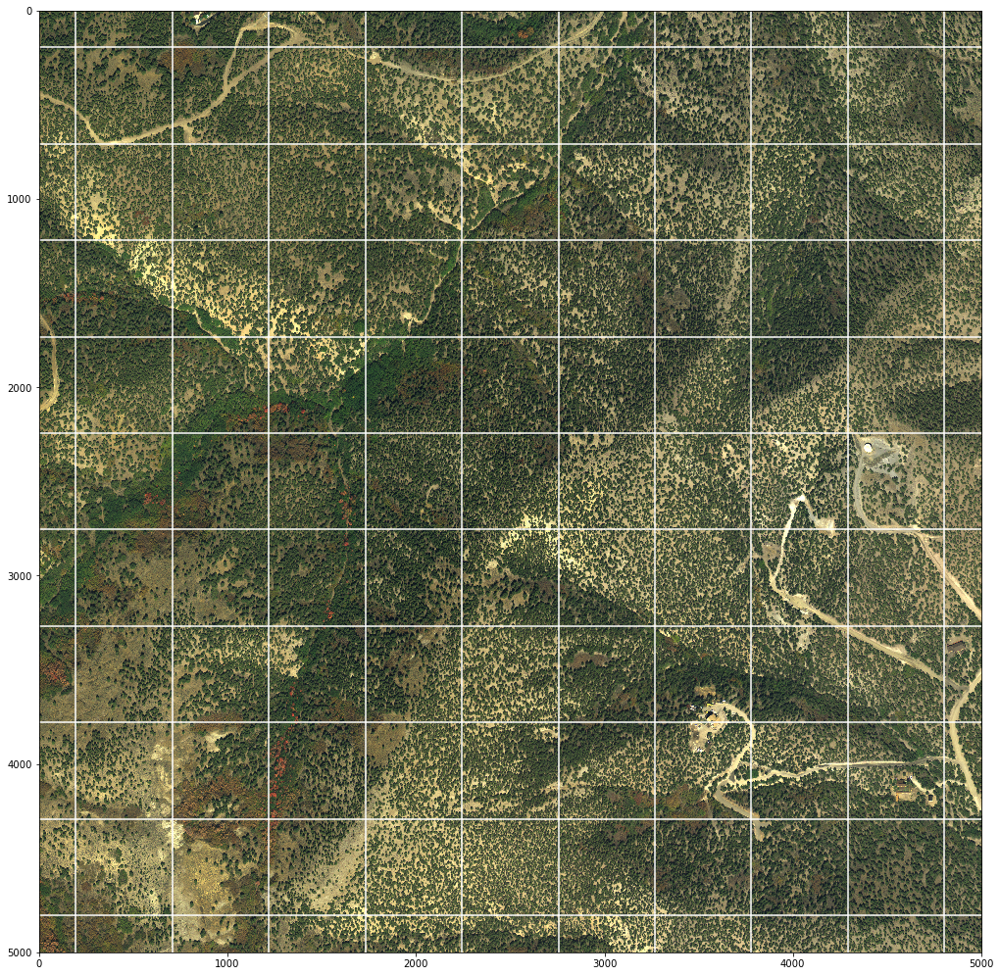

In [19]:
plt.figure(figsize = (14, 14))
imshow(img_unproc)

for coord in grid_set:
    plt.axhline(y=coord, color='w', linestyle='-')
    plt.axvline(x=coord, color='w', linestyle='-')

plt.tight_layout()
plt.savefig("../report/Figures/example_unproc.pdf")
plt.show()

# Examples Agriculture (Processed)

In [82]:
samples = 4

In [85]:
category = 'agriculture'
paths = random.sample(ima.list_path_of_images_by_category_and_label(IMAGE_FOLDER, category), samples)

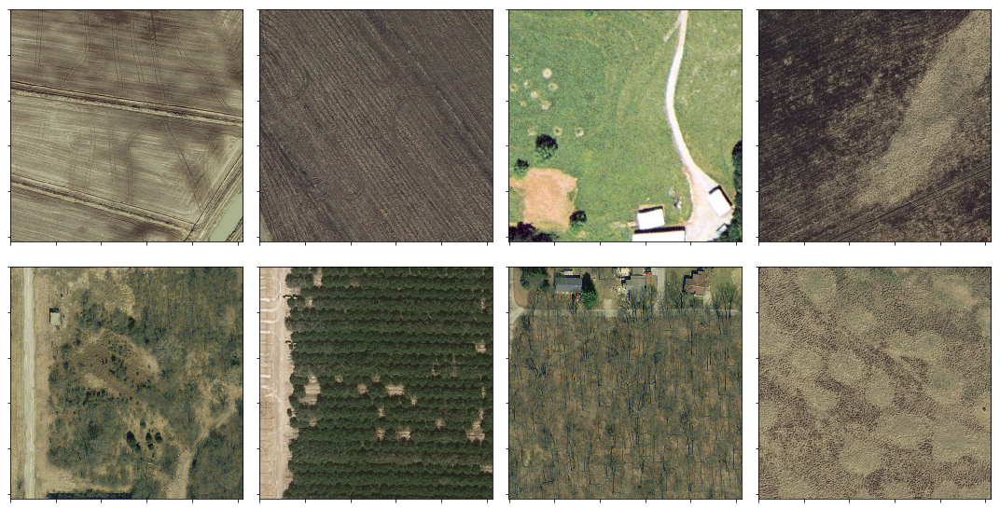

In [63]:
images = [ima.load_image_as_rgb_array(path) for path in paths]

dp.plot_image_array(images, fname_save = "../report/Figures/" + category + "_sample.pdf")

# Examples Semi-desert (Processed)

In [138]:
category = 'semi-desert'
paths_0 = random.sample(ima.list_path_of_images_by_category_and_label(IMAGE_FOLDER, category, label = 0), samples)
paths_1 = random.sample(ima.list_path_of_images_by_category_and_label(IMAGE_FOLDER, category, label = 2), samples)
paths = paths_0 + paths_1

images = [ima.load_image_as_rgb_array(path) for path in paths]

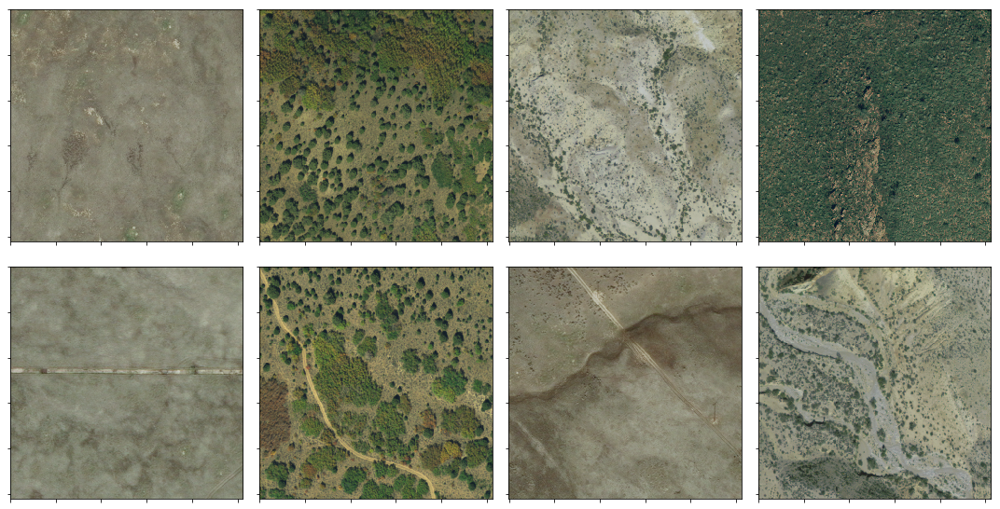

In [139]:
dp.plot_image_array(images, fname_save = "../report/Figures/" + category + "_sample.pdf")

# Examples Shrubland-grassland (Processed)

In [161]:
category = 'shrubland-grassland'
paths_0 = random.sample(ima.list_path_of_images_by_category_and_label(IMAGE_FOLDER, category, label = 0), samples)
paths_1 = random.sample(ima.list_path_of_images_by_category_and_label(IMAGE_FOLDER, category, label = 2), samples)
paths = paths_0 + paths_1

images = [ima.load_image_as_rgb_array(path) for path in paths]

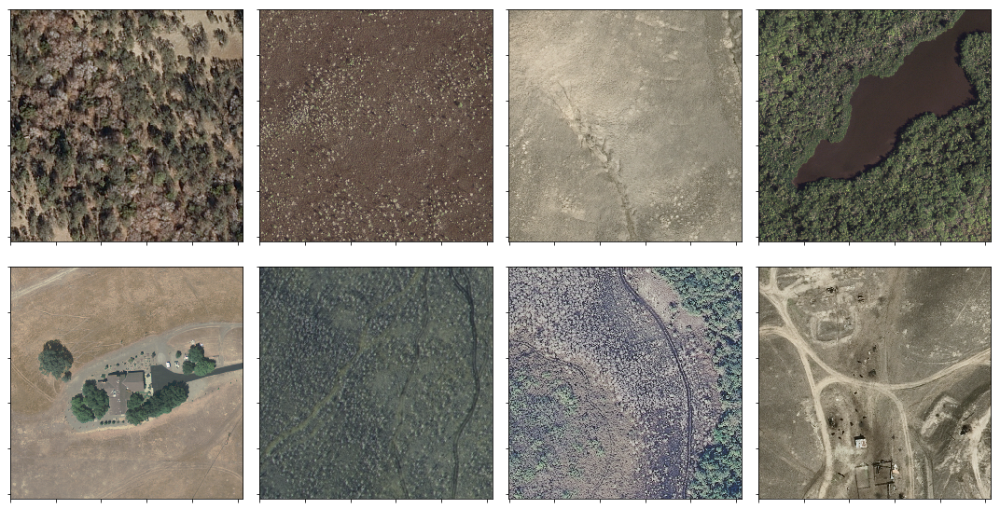

In [162]:
dp.plot_image_array(images, fname_save = "../report/Figures/" + category + "_sample.pdf")

# Examples Forest-woodland (Processed)

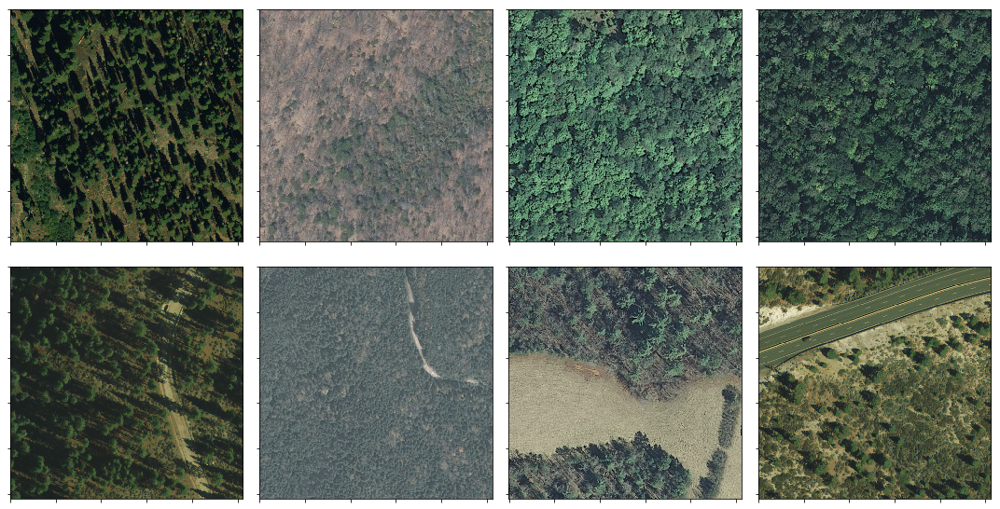

In [165]:
category = 'forest-woodland'
paths_0 = random.sample(ima.list_path_of_images_by_category_and_label(IMAGE_FOLDER, category, label = 0), samples)
paths_1 = random.sample(ima.list_path_of_images_by_category_and_label(IMAGE_FOLDER, category, label = 2), samples)
paths = paths_0 + paths_1

images = [ima.load_image_as_rgb_array(path) for path in paths]

dp.plot_image_array(images, fname_save = "../report/Figures/" + category + "_sample.pdf")

# Image Statistics

In [71]:
base_folder = MFP_IMAGE_FOLDER + 'usgs_512_res0.3m/' 
imstats_0p3m, df_images_0p3m = dp.get_image_statistics(base_folder, CATEGORIES, [0, 1, 2])

In [75]:
base_folder = MFP_IMAGE_FOLDER + 'usgs_512_res1m/' 
imstats_1m, df_images_1m = dp.get_image_statistics(base_folder, CATEGORIES, [0, 1, 2])

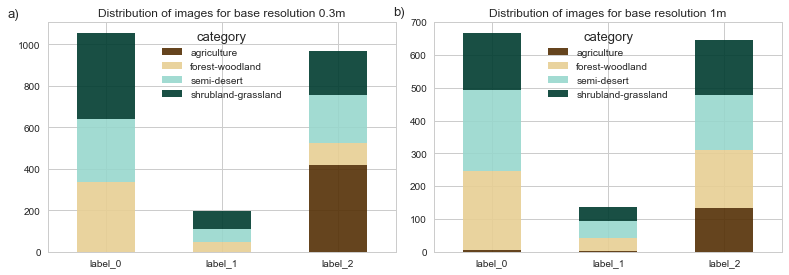

In [76]:
plt.rcParams.update({'font.size': 13})

fig, axes = plt.subplots(nrows=1, ncols=2, figsize = (11, 4))
imstats_0p3m.set_index('category').T.plot(kind='bar', stacked=True, colormap = 'BrBG', alpha = 0.9,
                                          title = "Distribution of images for base resolution 0.3m",
                                          rot = 0, ax = axes[0]     
                                          ).text(-0.85, 1130,"a)")

imstats_1m.set_index('category').T.plot(kind='bar', stacked=True, colormap = 'BrBG', alpha = 0.9,
                                        title = "Distribution of images for base resolution 1m",
                                        rot = 0, ax = axes[1]
                                       ).text(-0.85, 720,"b)")

plt.tight_layout()
plt.savefig("../report/Figures/imstats.pdf")
plt.show()

# Demo of Image Resampling

In [202]:
demo_image_path = os.path.join(IMAGE_FOLDER, "agriculture/label_2/17slu3874555191_x2205_y157_size512_baseres0.3m.png")
demo_image = ima.load_image_as_rgb_array(demo_image_path)

In [203]:
sizes = {}
base_res = 0.3
base_size = 512
images = {}
print("Sizes dictionary:")
for factor in range(1, 17, 2):
    res = round(base_res * factor,1)
    size = round(base_size/factor)
    sizes[res] = (size, size)
    images[res] = ima.degrade_image(demo_image, sizes[res])
    print("Resolution per pixel:", res, "m, Size:" , sizes[res])

Sizes dictionary:
Resolution per pixel: 0.3 m, Size: (512, 512)
Resolution per pixel: 0.9 m, Size: (171, 171)
Resolution per pixel: 1.5 m, Size: (102, 102)
Resolution per pixel: 2.1 m, Size: (73, 73)
Resolution per pixel: 2.7 m, Size: (57, 57)
Resolution per pixel: 3.3 m, Size: (47, 47)
Resolution per pixel: 3.9 m, Size: (39, 39)
Resolution per pixel: 4.5 m, Size: (34, 34)


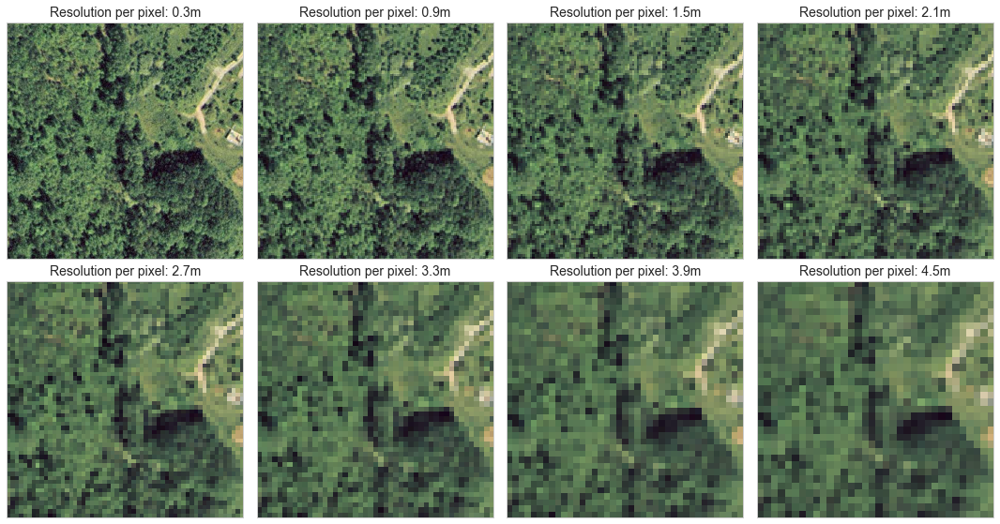

In [205]:
dp.plot_image_array(images, fname_save = "../report/Figures/demo_degrade.pdf", resolutions = list(sizes.keys()))